# Particle analysis tutorial 

One common image analysis task which can be greatly improved by programatic help is measuring particle features from TEM images. TEM is commonly used as a method for screening nanoparticle size and morphology, in combination with more basic charactorisation like DLS. However, manually measuring nanoparticles can be time consuming and subject to a lot of user bias. By automating the particle analysis workflow we can access much greater number of particles allowing for improved statistics, as well as being less subject to user bias. 

Here I present a method to use SimpliPyTEM to gain insight into particle morphology. While this method is not bulletproof, it can be effectively used to analyse populations. It does require some user input at the moment (choosing threshold) and currently works best with particles with very distinct contrast compared to the background. Particles with contrast close to the background will be a challenge to select. 



In [1]:
from SimpliPyTEM.Micrograph_class import * 
from SimpliPyTEM.Thresholding import * 
#from scipy.spatial import distance as dist

<Figure size 640x480 with 0 Axes>

## Locate files

Here I get a list of files from the directory Jose_files/A7_Diblock

In [44]:
#print(os.getcwd())
#print(os.listdir('Jose_files'))
dis = ['Jose_files/A1_Tribloc/'+x for x in os.listdir('Jose_files/A1_Tribloc') if 'dm' in x and 'Tri' in x]
print(dis)

['Jose_files/A1_Tribloc/A1_Tribloc-100000X-0003.dm4', 'Jose_files/A1_Tribloc/A1_Tribloc-100000X-0002.dm4', 'Jose_files/A1_Tribloc/A1_Tribloc-100000X-0004.dm4', 'Jose_files/A1_Tribloc/A1_Tribloc-150000X-0007.dm4', 'Jose_files/A1_Tribloc/A1_Tribloc-120000X-0010.dm4', 'Jose_files/A1_Tribloc/A1_Tribloc-30000X-0009.dm4', 'Jose_files/A1_Tribloc/A1_Tribloc-200000X-0011.dm4', 'Jose_files/A1_Tribloc/A1_Tribloc-150000X-0014.dm4', 'Jose_files/A1_Tribloc/A1_Tribloc-80000X-0001.dm4', 'Jose_files/A1_Tribloc/A1_Tribloc-150000X-0012.dm4', 'Jose_files/A1_Tribloc/A1_Tribloc-100000X-0005.dm4', 'Jose_files/A1_Tribloc/A1_Tribloc-250000X-0006.dm4', 'Jose_files/A1_Tribloc/A1_Tribloc-250000X-0008.dm4']


## Open Micrograph

In [139]:
im = Micrograph()
im.open_dm('Jose_files/A7_Dibloc/A7_Dibloc-150000X-0014.dm4')

Jose_files/A7_Dibloc/A7_Dibloc-150000X-0014.dm4 opened as a Micrograph object


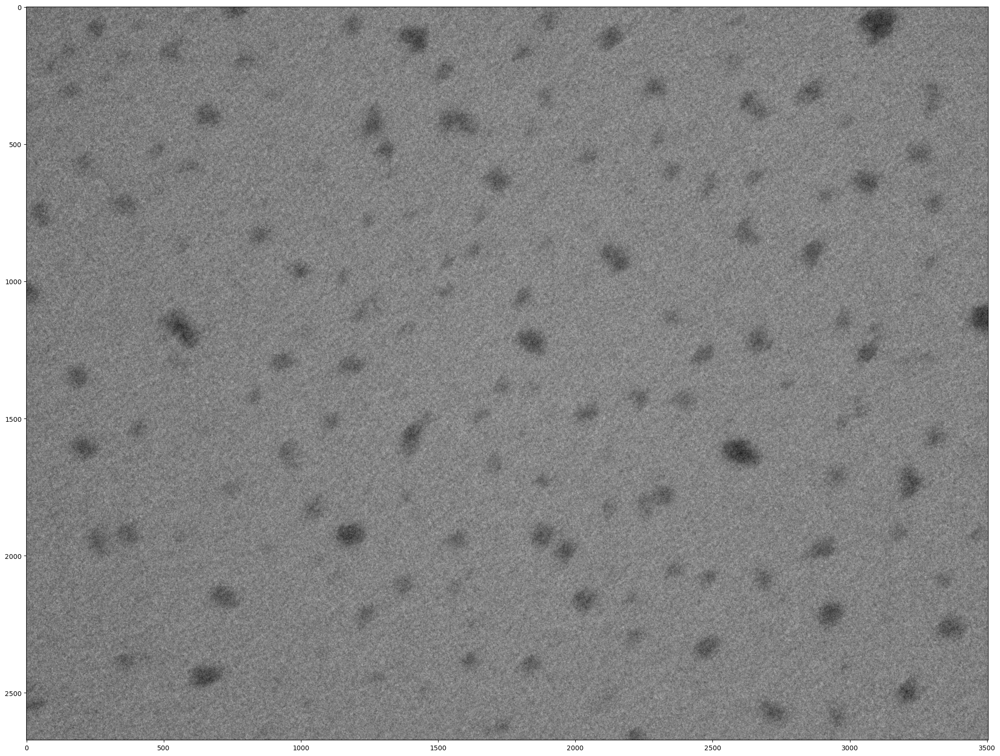

In [5]:
im.imshow()

## Preprocess image

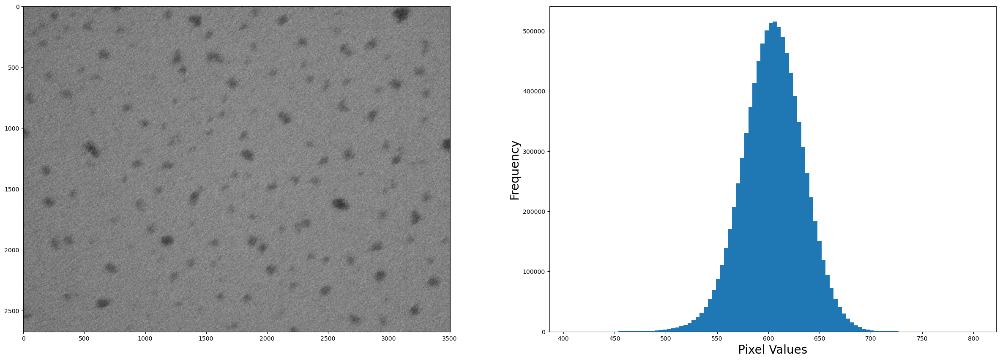

In [15]:
plot_histogram(im.image,True)

Convert to 8bit:  

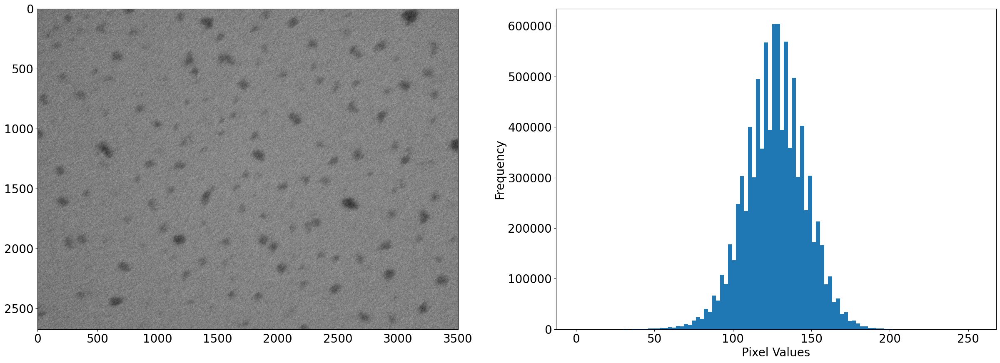

In [140]:
im8bit = im.convert_to_8bit()
plot_histogram(im8bit.image, True)

Normalise contrast across the image - particularly important if there is uneven contrast in the image. 

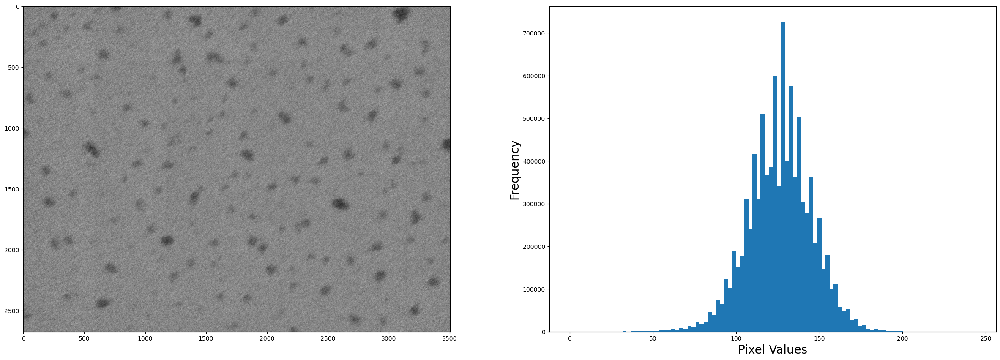

In [25]:
im8bitLN= im8bit.Local_normalisation(6)
plot_histogram(im8bitLN.image,True)

Strong gaussian filter - this smooths the edges of the particles to make them easier to threshold:

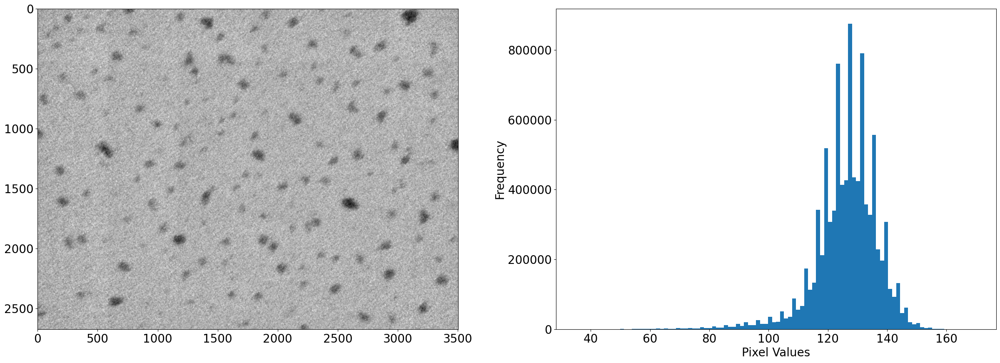

In [79]:
im8bit_gaussian= im8bitLN.gaussian_filter(9)
plot_histogram(im8bit_gaussian.image,True)

Maxmium value :  222
Minimum value :  60


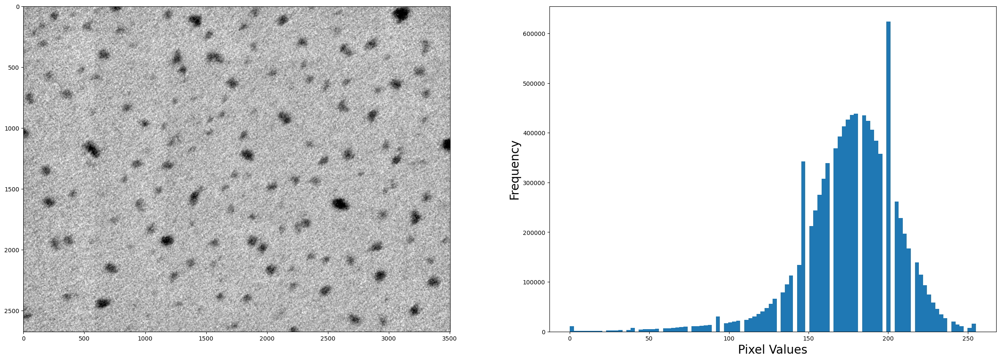

In [36]:
im8bit_clipped = im8bit_gaussian.clip_contrast(saturation=0.1)
plot_histogram(im8bit_clipped.image,True)

Bin image to speed up particle picking:

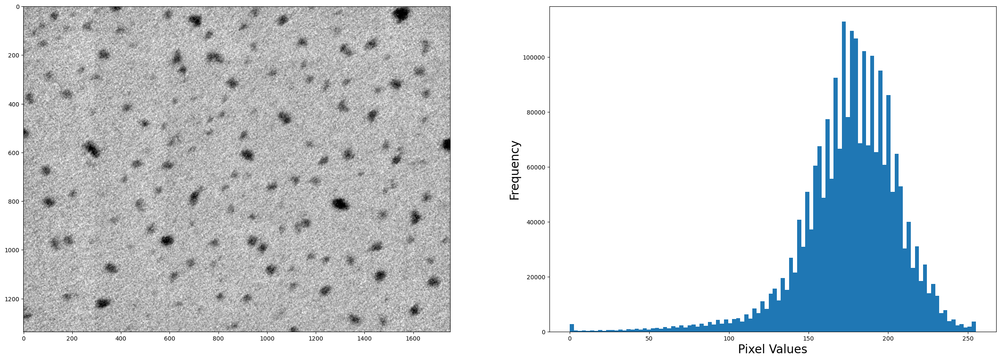

In [42]:
im_processed = im8bit_clipped.bin_image(2)
plot_histogram(im_processed.image, True)

## Thresholding

Apply a threshold value to locate the particles. This is simply a pixel value - anything less than the threshold goes to white (particle), anything greater than goes to black (background). 

This is guided by the histogram and by trial and error:

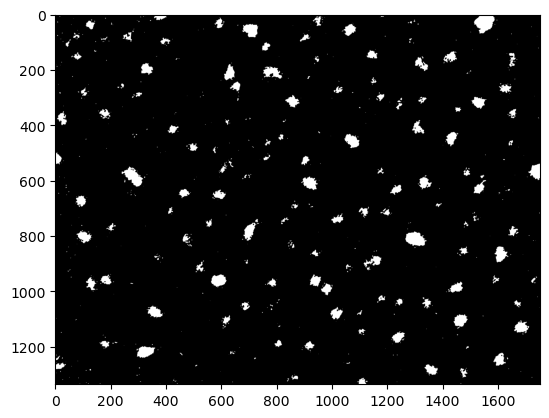

In [44]:
thresh = Threshold(im_processed.image, 120)
plt.imshow(thresh)
plt.show()


How do thresholds compare?

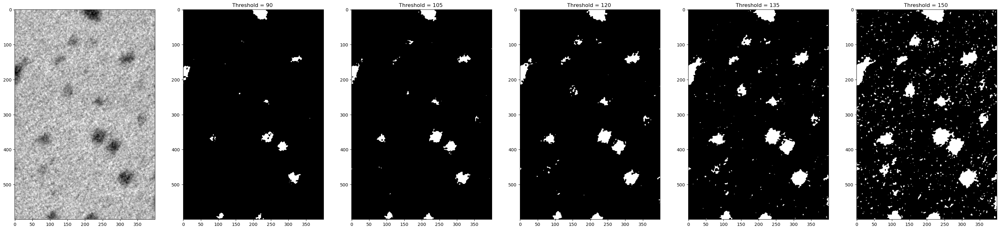

In [52]:
thresholds = [90, 105,120,135,150]
fig, ax = plt.subplots(1,6, figsize =(40,10))
ax[0].imshow(im_processed.image[600:1200, 700:1100])
for i in range(len(thresholds)):
    ax[i+1].imshow(Threshold(im_processed.image, thresholds[i])[600:1200, 700:1100])
    ax[i+1].set_title('Threshold = {} '.format(thresholds[i]))
    
plt.show()

## I recommend double cliking on this figure to see a zoomed in version


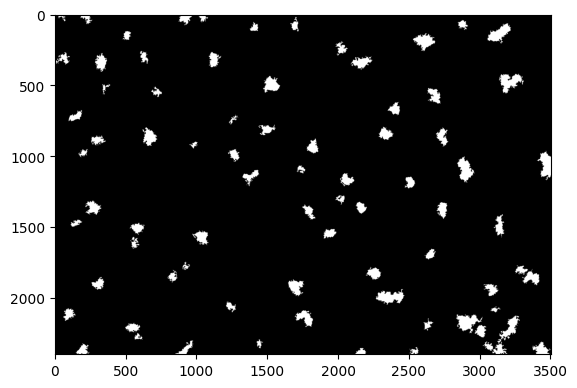

In [100]:
threshold = 115

## Locating particles

Using a function called 'Find_contours' which locates the edges of the particles. This also filters the particles by size - a minimum area (in pixels) is given. It will also remove particles on the edge of the image. 

In [58]:
contours_im, mask =Find_contours(thresh, min_size=500)

#Contours_im is a list of arrays containing the coordinates which define the particles selected. 
#The mask is a binary image showing particles in white. 

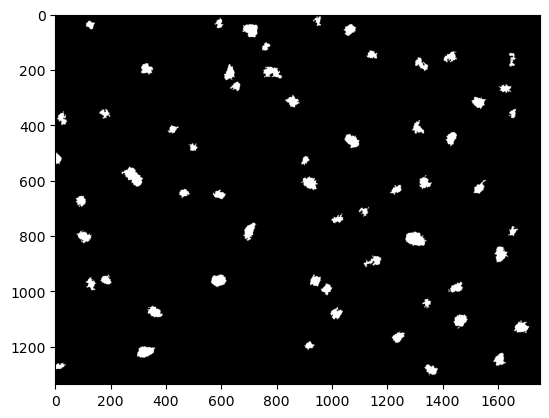

In [60]:
plt.imshow(mask)
plt.show()

## Collecting and plotting paraticle data

Uses Collect_particle_data() function with two imputs: the contours_im defined in the last section and the pixel size of the image, which can be located from the micrograph object im_processed (remember that the image has been binned so its important to use im_processed rather than im) 


In [61]:
data = Collect_particle_data(contours_im, im_processed.pixelSize)

The data is in a dictionary with keys being the features described. To see the features available use data.keys()


In [65]:
print(data.keys())

dict_keys(['Max_length', 'Area', 'Centroid', 'Aspect_ratio', 'Perimeter', 'Circularity', 'Width', 'Height', 'Radius', 'Major-Minor Ratio'])


To use the individual data, use these keys: 

In [66]:
print(data['Width'])

[15.258943314434305, 16.975778102874756, 24.8978057256345, 25.78262190083865, 30.78254224995544, 18.897910210844316, 25.463667154312134, 21.97175499284674, 24.8749355513537, 31.601904828214856, 30.13656505738618, 27.743534280145013, 25.81045681328328, 18.1450454434804, 23.007066142755775, 20.218411840424892, 31.845916312512827, 23.52152634207414, 21.036997329232577, 26.170991241931915, 21.404899267422707, 33.91695953578392, 24.567124483423186, 15.84405929286038, 27.954403438972122, 26.9199543726736, 30.17617233537908, 16.12031594206428, 20.006146348989205, 26.95498545722853, 20.890232653718726, 22.55549487536871, 26.154003203084358, 20.31655985711484, 23.974218722888963, 29.28321830674986, 22.506914642612855, 25.78766488759311, 20.236043406474664, 21.087300380095826, 23.09371161662375, 36.26114430488383, 27.582825166136217, 24.049024375527097, 30.21116834297959, 20.018165602332033, 27.58563941717148, 22.98928482509291, 26.50814283311979, 24.752325406297814, 31.625336233766348, 28.48533

We can plot some of this data using matplotlib: 

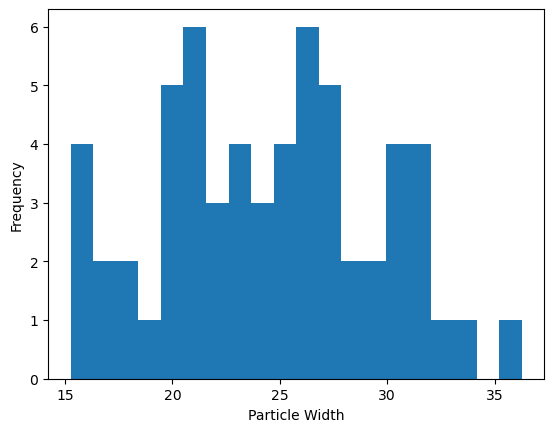

In [68]:
plt.hist(data['Width'], bins=20)
plt.xlabel('Particle Width')
plt.ylabel('Frequency')
plt.show()

This is a complex example of plotting the data, feel free to copy/edit:

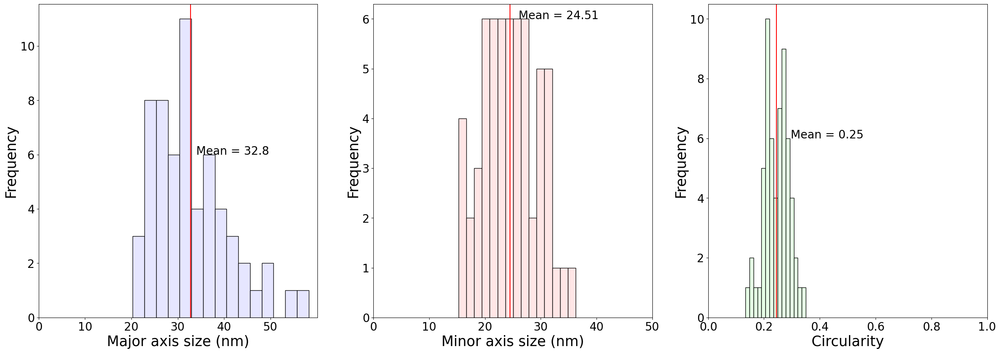

In [77]:
##### hdata= data['Height']
wdata = data['Width']
cdata= data['Circularity']

colors = [(0.9,0.9,1), (1,0.9,0.9), (0.9,1,0.9)]
plt.rcParams['font.size'] = '20'

fig, ax = plt.subplots(1,3, figsize=(30,10))

ax[0].hist(hdata, color =colors[0], edgecolor='black', bins=15)
ax[0].set_xlabel('Major axis size (nm)', fontsize=25)
ax[0].set_xticks(list(range(0,int(max(hdata)+2),10)))
ax[0].set_xticklabels(list(range(0,int(max(hdata)+2),10)),fontsize=20)
#ax[0].set_title('Major axis size',fontsize=25)
ax[0].set_ylabel('Frequency',fontsize=25)
ax[0].axvline(np.mean(hdata), color='red')
label='Mean = ' +str(round(np.mean(hdata),2))
ax[0].annotate(label, (int(np.mean(hdata))+2,6), fontsize=20)

ax[1].hist(wdata, color = colors[1], edgecolor='black', bins=15)
ax[1].set_xlabel('Minor axis size (nm)', fontsize=25)
ax[1].set_xticks(list(range(0,int(max(hdata)+2),10)))
ax[1].set_xticklabels(list(range(0,int(max(hdata)+2),10)),fontsize=20)
ax[1].set_ylabel('Frequency',fontsize=25)

#ax[1].set_title('Minor axis size',fontsize=25)
ax[1].axvline(np.mean(wdata), color='red')
label='Mean = ' +str(round(np.mean(wdata),2))
ax[1].annotate(label, (int(np.mean(wdata))+2,6), fontsize=20)

ax[2].hist(cdata, color = colors[2], edgecolor='black', bins=15)
ax[2].set_xlabel('Circularity', fontsize=25)
ax[2].set_xticks([x/10 for x in range(0,12,2)])
ax[2].set_xticklabels([x/10 for x in range(0,12,2)],fontsize=20)
#ax[2].set_title('Major axis:Minor Axis ratio',fontsize=25)
ax[2].set_ylabel('Frequency',fontsize=25)
ax[2].axvline(np.mean(cdata), color='red')
label='Mean = ' +str(round(np.mean(cdata),2))
ax[2].annotate(label, (np.mean(cdata)+0.05,6), fontsize=20)
plt.show()

## Using multiple files

In [114]:
diblock_chosen_files = [ 'Jose_files/A7_Dibloc/A7_Dibloc-150000X-0016.dm4', 'Jose_files/A7_Dibloc/A7_Dibloc-150000X-0017.dm4', 'Jose_files/A7_Dibloc/A7_Dibloc-150000X-0003.dm4', 'Jose_files/A7_Dibloc/A7_Dibloc-300000X-0006.dm4', 'Jose_files/A7_Dibloc/A7_Dibloc-150000X-0014.dm4']

#triblock_chosen_files = [  'Jose_files/A1_Tribloc/A1_Tribloc-100000X-0004.dm4', 'Jose_files/A1_Tribloc/A1_Tribloc-150000X-0007.dm4', 
                         #'Jose_files/A1_Tribloc/A1_Tribloc-120000X-0010.dm4',   'Jose_files/A1_Tribloc/A1_Tribloc-150000X-0014.dm4']



In [115]:
def preprocess(im, binn=True):
    im = im.convert_to_8bit()
    im = im.Local_normalisation(6)
    im = im.gaussian_filter(9)
    im = im.clip_contrast(saturation=0.05)
    if binn:
        im = im.bin_image()
    return im



In [128]:
#Create lists for the image masks and data
masks, alldata, names = [],[], []

At this point I would like to be able to loop over the files, however the thresholds need to be decided manually, so I will do this for each file:

Jose_files/A7_Dibloc/A7_Dibloc-150000X-0014.dm4 opened as a Micrograph object


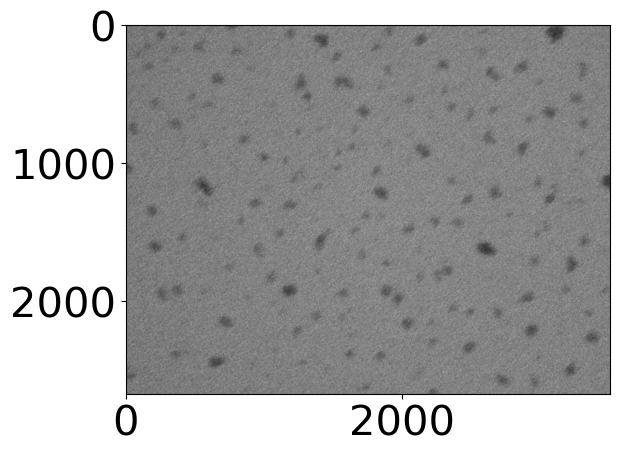

Maxmium value :  224
Minimum value :  49


In [152]:
name=diblock_chosen_files[4]
im = Micrograph()
im.open_dm(name)

plt.imshow(im.image)
plt.show()
im_processed = preprocess(im)



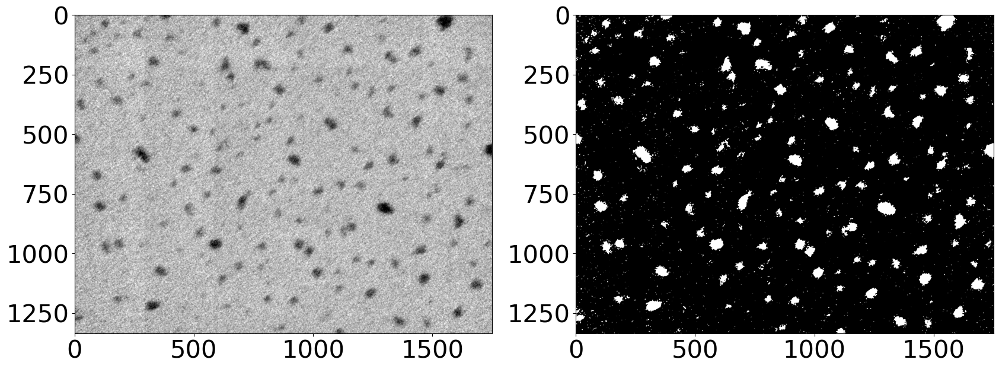

In [154]:
thresh = Threshold(im_processed.image, 140)
#contours_im, mask = Find_contours()
fig,ax = plt.subplots(1,2,figsize=(20,20))
ax[0].imshow(im_processed.image)
ax[1].imshow(thresh)
plt.show()

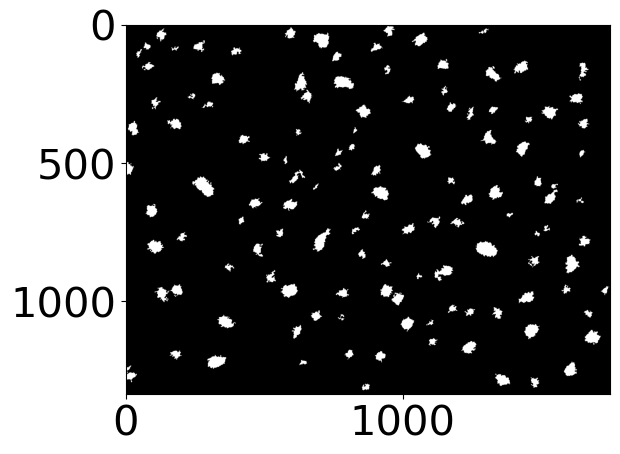

In [155]:
contours_im, mask = Find_contours(thresh, min_size=150, complex_coords=True)
data = Collect_particle_data(contours_im, im.pixelSize, multimeasure=True)

plt.imshow(mask)
plt.show()

In [156]:
#im_processed.pixelSize*=1000
print(im_processed.pixelSize)
print(im_processed.pixelUnit)

0.7073240876197815
nm


In [157]:
#save data and masks into lists
alldata.append(data)
masks.append(mask)
names.append(name)

## REPEAT last 4 boxes for each file 
(Change the number in diblock_chosen_files[0] )

### Joining together
Now we have a list of dictionarys - we can make this into one dictionary like this:

In [159]:
alldata_dict = {
'Area':[],
'Centroid':[],
'Aspect_ratio':[],
'Perimeter':[],
'Circularity':[],
'Width':[],
'Height':[],
'Radius':[],
'Major-Minor Ratio':[],
'Min diameter':[],
'Max diameter':[],
'Mean diameter':[],
'Stddev diameter':[]}

print(alldata[0].keys())

for dset in alldata:
    for key in dset:
        alldata_dict[key].append(dset[key])

dict_keys(['Area', 'Centroid', 'Aspect_ratio', 'Perimeter', 'Circularity', 'Width', 'Height', 'Radius', 'Major-Minor Ratio', 'Min diameter', 'Max diameter', 'Mean diameter', 'Stddev diameter'])


This puts it into one dictionary, the only problem is the data in each category is split into lists from each image. This can be fixed using the function Flatten_list(). You can see this if you look carefully below.

In [103]:
#print(alldata_dict['Width'])

print('There are {} datasets in the dictionary'.format(len(alldata_dict['Width'])))

There are 4 datasets in the dictionary


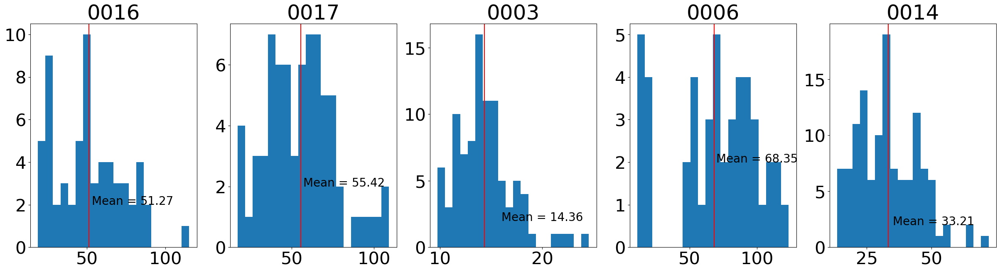

In [164]:
fig, ax = plt.subplots(1,5,figsize=(30,7))
for i,dset in enumerate(alldata_dict['Mean diameter']):
    ax[i].set_title(names[i][-8:-4])
    ax[i].hist(dset, 20)
    ax[i].axvline(np.mean(dset), color='red')
    label='Mean = ' +str(round(np.mean(dset),2))
    ax[i].annotate(label, (int(np.mean(dset))+2,2), fontsize=20)
plt.show()

In [88]:
width_data = Flatten_list(alldata_dict['Width'])
print('There is now a single dataset with {} datapoints'.format(len(width_data)))

There is now a single dataset with 154 datapoints


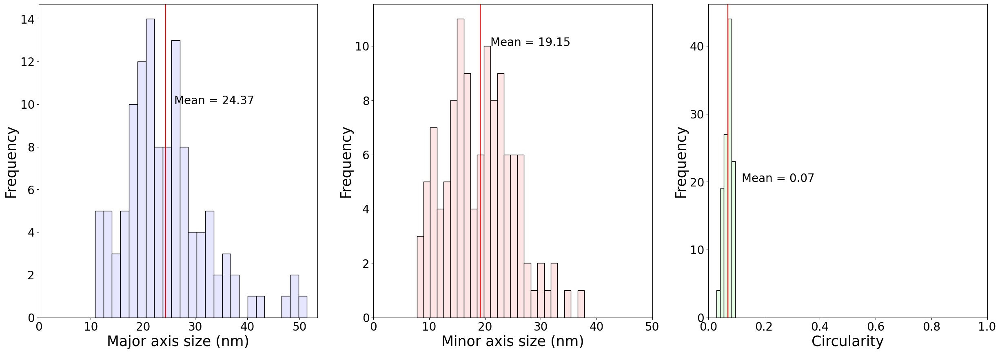

<Figure size 640x480 with 0 Axes>

In [136]:

wdata = Flatten_list(alldata_dict['Width'])
hdata = Flatten_list(alldata_dict['Height'])
cdata = Flatten_list(alldata_dict['Circularity'])

colors = [(0.9,0.9,1), (1,0.9,0.9), (0.9,1,0.9)]
plt.rcParams['font.size'] = '20'

fig, ax = plt.subplots(1,3, figsize=(30,10))

ax[0].hist(hdata, color =colors[0], edgecolor='black', bins=25)
ax[0].set_xlabel('Major axis size (nm)', fontsize=25)
ax[0].set_xticks(list(range(0,int(max(hdata)+2),10)))
ax[0].set_xticklabels(list(range(0,int(max(hdata)+2),10)),fontsize=20)
#ax[0].set_title('Major axis size',fontsize=25)
ax[0].set_ylabel('Frequency',fontsize=25)
ax[0].axvline(np.mean(hdata), color='red')
label='Mean = ' +str(round(np.mean(hdata),2))
ax[0].annotate(label, (int(np.mean(hdata))+2,10), fontsize=20)

ax[1].hist(wdata, color = colors[1], edgecolor='black', bins=25)
ax[1].set_xlabel('Minor axis size (nm)', fontsize=25)
ax[1].set_xticks(list(range(0,int(max(hdata)+2),10)))
ax[1].set_xticklabels(list(range(0,int(max(hdata)+2),10)),fontsize=20)
ax[1].set_ylabel('Frequency',fontsize=25)

#ax[1].set_title('Minor axis size',fontsize=25)
ax[1].axvline(np.mean(wdata), color='red')
label='Mean = ' +str(round(np.mean(wdata),2))
ax[1].annotate(label, (int(np.mean(wdata))+2,10), fontsize=20)

ax[2].hist(cdata, color = colors[2], edgecolor='black', bins=5)
ax[2].set_xlabel('Circularity', fontsize=25)
ax[2].set_xticks([x/10 for x in range(0,12,2)])
ax[2].set_xticklabels([x/10 for x in range(0,12,2)],fontsize=20)
#ax[2].set_title('Major axis:Minor Axis ratio',fontsize=25)
ax[2].set_ylabel('Frequency',fontsize=25)
ax[2].axvline(np.mean(cdata), color='red')
label='Mean = ' +str(round(np.mean(cdata),2))
ax[2].annotate(label, (np.mean(cdata)+0.05,20), fontsize=20)
plt.show()
plt.savefig('TriBlock_sizing_004_007_010_014.png')

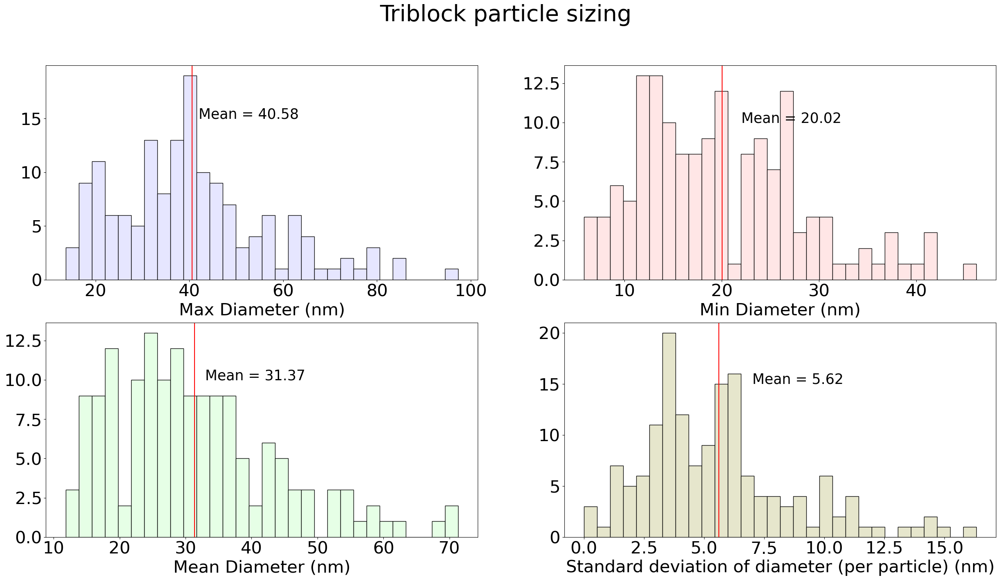

In [90]:
maxd = Flatten_list(alldata_dict['Max diameter'])
mind = Flatten_list(alldata_dict['Min diameter'])
meand = Flatten_list(alldata_dict['Mean diameter'])
stdd = Flatten_list(alldata_dict['Stddev diameter'])
plt.rcParams['font.size'] = '30'
colors = [(0.9,0.9,1), (1,0.9,0.9), (0.9,1,0.9), (0.9,0.9,0.8)]

fig,ax = plt.subplots(2,2,figsize=(30,15))
fig.suptitle('Triblock particle sizing', fontsize=40)

ax[0,0].hist(maxd, 30, color=colors[0],edgecolor='black')
ax[0,0].set_xlabel('Max Diameter (nm)', fontsize=30)

ax[0,0].axvline(np.mean(maxd), color='red')
label='Mean = ' +str(round(np.mean(maxd),2))
ax[0,0].annotate(label, (int(np.mean(maxd))+2,15), fontsize=25)


ax[0,1].hist(mind,30,color=colors[1],edgecolor='black')
ax[0,1].set_xlabel('Min Diameter (nm)', fontsize=30)

label='Mean = ' +str(round(np.mean(mind),2))
ax[0,1].annotate(label, (int(np.mean(mind))+2,10), fontsize=25)
ax[0,1].axvline(np.mean(mind), color='red')


ax[1,0].hist(meand, 30,color=colors[2],edgecolor='black')
ax[1,0].set_xlabel('Mean Diameter (nm)', fontsize=30)

label='Mean = ' +str(round(np.mean(meand),2))
ax[1,0].annotate(label, (int(np.mean(meand))+2,10), fontsize=25)
ax[1,0].axvline(np.mean(meand), color='red')


ax[1,1].hist(stdd,30,color=colors[3],edgecolor='black')
ax[1,1].set_xlabel('Standard deviation of diameter (per particle) (nm)', fontsize=30)
label='Mean = ' +str(round(np.mean(stdd),2))
ax[1,1].annotate(label, (int(np.mean(stdd))+2,15), fontsize=25)
ax[1,1].axvline(np.mean(stdd), color='red')
plt.show()

## Saving

Here I make it into a Pandas dataframe and save it as a .csv file

Pandas is a python module which is excellent for handling data in 'dataframes', theses are analogous to an excel spreadsheet.

In [91]:
import pandas as pd
#didf = pd.DataFrame()
tridf = pd.DataFrame()

In [92]:
#didf = pd.DataFrame()
for key in alldata_dict:
    if key=='Centroid':
        tridf['Centroid_x'] = [x[0] for x in Flatten_list(alldata_dict[key])]
        tridf['Centroid_y'] = [x[1] for x in Flatten_list(alldata_dict[key])]
    else:
        #print(key)
        #print(alldata_dict[key])
        tridf[key] = [float(x) for x in Flatten_list(alldata_dict[key])]

    
tridf.head()



,Area,Centroid_x,Centroid_y,Aspect_ratio,Perimeter,Circularity,Width,Height,Radius,Major-Minor Ratio,Min diameter,Max diameter,Mean diameter,Stddev diameter
0,51.563634,25.554146,69.735195,0.650264,53.425547,0.086478,9.003872,13.846494,7.048286,1.537838,12.165525,25.059928,19.599849,4.207499
1,36.513335,75.427718,1279.126643,0.392857,37.704849,0.058922,5.627705,14.325068,7.185411,2.545455,12.165525,20.223748,17.208219,3.588481
2,328.620014,93.069561,570.874817,0.578170,116.783591,0.099220,18.396209,31.818012,16.611612,1.729596,23.345235,63.387696,42.662253,11.393618
3,285.955687,529.958352,472.831274,0.807867,81.146479,0.174047,17.897897,22.154510,11.699824,1.237828,31.240999,43.278170,37.445995,3.265598
4,32.848914,562.628154,370.272244,0.515982,41.622168,0.057608,7.102711,13.765430,6.892587,1.938053,13.601471,13.601471,13.601471,0.000000


In [100]:
print(tridf[tridf['Stddev diameter']==0])

         Area   Centroid_x   Centroid_y  Aspect_ratio  Perimeter  Circularity  \
4   32.848914   562.628154   370.272244      0.515982  41.622168     0.057608   
11  42.009966  1408.485981   422.172378      0.907407  29.694653     0.141877   
13  45.805259  1572.208571  1091.671429      0.805556  30.418178     0.133761   

       Width     Height    Radius  Major-Minor Ratio  Min diameter  \
4   7.102711  13.765430  6.892587           1.938053     13.601471   
11  7.830199   8.629200  4.966882           1.102041     19.416488   
13  7.605497   9.441306  5.341412           1.241379     15.264338   

    Max diameter  Mean diameter  Stddev diameter  
4      13.601471      13.601471              0.0  
11     19.416488      19.416488              0.0  
13     15.264338      15.264338              0.0  


In [102]:
tridf.to_csv('TriBlock_images_particle_sizing.csv')